**CS6140 Final project: DCGAN with WGAN-GP trainer**

# Import and defining classes

In [1]:
    # === Uncomment to clone and access repo 
!git clone https://github.com/timmytonga/gans-vi 
%cd gans-vi
# !git pull
!ls

Cloning into 'gans-vi'...
remote: Enumerating objects: 123, done.
remote: Counting objects: 100% (123/123), done.
remote: Compressing objects: 100% (99/99), done.
remote: Total 123 (delta 75), reused 56 (delta 24), pack-reused 0
Receiving objects: 100% (123/123), 38.64 KiB | 9.66 MiB/s, done.
Resolving deltas: 100% (75/75), done.
/content/gans-vi
dcgan_models.py      inception_score.py		 train_wgan_gp_extra.py
extraSGD.py	     README.md			 train_wgan_gp.py
fit_extrapastsgd.py  resnet_models.py		 utils.py
fit_extrasgd.py      train_wgan_gp_extrapast.py  wgan_gp_loss.py


In [2]:
import torch
import matplotlib.pyplot as plt
from torch import nn
from torch.utils.data import DataLoader
# torchvision
from torchvision.datasets import CIFAR10
import torchvision.transforms as transforms

from dcgan_models import Generator, Discriminator
from wgan_gp_loss import disc_loss_wgan_gp, gen_loss_wgan_gp
from utils import make_noise, show_tensor_images, get_cur_timestamp


from tqdm.auto import tqdm  # for visualizing progress per epoch
import time

print(torch.cuda.get_device_name())

Tesla T4


### [Optional] Setting up Google Drive for Loading and Saving checkpoints

In [4]:
# first, setting up check-point directory (we want this to be on a permanent storage like google drive or local)
# first mount the google drive here, hello
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [16]:
!mkdir ../drive/My\ Drive/cs6140/gan_avgextraadam_batchnorm

# TRAINING

In [17]:
# =========================================================================== #
#                  FIRST, MUST MAKE SURE PATHS ARE CORRECT                    #
# =========================================================================== #
CHECKPOINT_PATH="/content/drive/My Drive/cs6140/gan_avgextraadam_batchnorm/"
SAVE_MODEL_PATH="/content/drive/My Drive/cs6140/gan_model/"
DISC_PATH = SAVE_MODEL_PATH + 'disc_weight.pth'
GEN_PATH = SAVE_MODEL_PATH + 'gen_weight.pth'


# =========================================================================== #
#                  SET ANY CHECKPOINT FILE HERE (ignore if no checkpoint)     #
# =========================================================================== #
CHECKPOINTFILENAME = "[20-Nov-2020(17:43)]250avgextraAdam.pt"
CHECKPOINTFILEPATH = CHECKPOINT_PATH + CHECKPOINTFILENAME  # change the last part
ENABLE_CHECKPOINT = True

print(torch.cuda.get_device_capability())

(7, 5)


In [18]:
# =========================================================================== #
#                  GET MODELS                                                 #
# =========================================================================== #
from dcgan_models import Discriminator, Generator

wgan_gp = True    # do we want to do WGAN or WGAN-GP?

device = 'cpu'
if torch.cuda.is_available():  # use gpu if available
	device = 'cuda'


gen = Generator().to(device)
disc = Discriminator().to(device)
gen2 = Generator().to(device)
disc2 = Discriminator().to(device) 

### Setting up hyperparameters and environment variables

Files already downloaded and verified
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


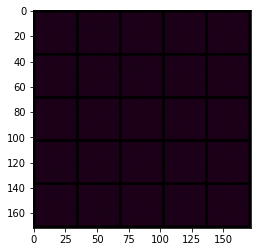

Normalize and then unnormalize


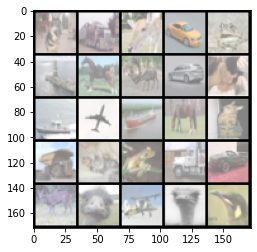

In [24]:
# =========================================================================== #
#                   HYPERPARAMETERS AND TRAINING DATA                         #
# =========================================================================== #
z_dim = 128
lr_gen = 0.00005      # learning rate
lr_disc = 0.0005
beta_1 = 0.5      # first moment's momentum (ADAM hyperparam)
beta_2 = 0.9      # second moment's momentum
weight_clipping = 0.01
c_lambda = 10     # for gradient penalty
batch_size = 64

# unnorm_mean = (0.4914, 0.4822, 0.4465)
# unnorm_var=(0.2023, 0.1994, 0.2010)
unnorm_mean = (0.5, 0.5, 0.5)
unnorm_var=(0.5, 0.5, 0.5)
# get data and loader
transform_train = transforms.Compose([
	# transforms.RandomHorizontalFlip(),
	transforms.ToTensor(),
	# transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
	transforms.Normalize(unnorm_mean, unnorm_var)
])


trainset = DataLoader(CIFAR10(root='.', download=True, transform=transform_train), batch_size=batch_size, shuffle=True)
trainset2 = DataLoader(CIFAR10(root='.', download=True, transform=transforms.ToTensor()), batch_size=batch_size, shuffle=True)

from torchvision.utils import make_grid


# before training initialize weight
def weights_init(m):
	if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
		torch.nn.init.normal_(m.weight, 0.0, 0.02)
	if isinstance(m, nn.BatchNorm2d):
		torch.nn.init.normal_(m.weight, 0.0, 0.02)
		torch.nn.init.constant_(m.bias, 0)
	
def weights_init_zero(m):
	if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
			torch.nn.init.constant_(m.weight, 0.0)
	if isinstance(m, nn.BatchNorm2d):
			torch.nn.init.constant_(m.weight, 0.0)
			torch.nn.init.constant_(m.bias, 0.0)

def show_tensor_images(image_tensor, num_images=25, unnorm_mean = (0,0,0), unnorm_var = (1,1,1)):
		"""
		Function for visualizing images: Given a tensor of images, number of images, and
		size per image, plots and prints the images in an uniform grid.

		"""
		var = torch.tensor(unnorm_var).view(1, 3, 1, 1)
		mean = torch.tensor(unnorm_mean).view(1, 3, 1, 1)
		image_unflat = image_tensor.detach().cpu()
		image_unflat = image_unflat.mul_(var).add_(mean) 
		image_grid = make_grid(image_unflat[:num_images], nrow=5)
		plt.imshow(image_grid.permute(1, 2, 0).squeeze())
		plt.show()

gen = gen.apply(weights_init)
disc = disc.apply(weights_init)
gen2 = gen2.apply(weights_init_zero)
disc2 = disc2.apply(weights_init_zero)
img = gen(make_noise(25, z_dim, device=device))
show_tensor_images(img)

print("Normalize and then unnormalize")
for testimg, label in trainset2:
		show_tensor_images(testimg, unnorm_mean = unnorm_mean, unnorm_var=unnorm_var)
		break

In [20]:
# =========================================================================== #
#                  SET OPTIMIZERS HERE                                        #
# =========================================================================== #
import pytz
from datetime import datetime

# define the Adam optimizers
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr_gen, betas=(beta_1, beta_2))
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr_disc, betas=(beta_1, beta_2))

# define SGD 
# gen_opt = torch.optim.SGD(gen.parameters(), lr=lr)
# disc_opt = torch.optim.SGD(disc.parameters(), lr=lr)

# =========================================================================== #
#                  SET LOSS FUNCTIONS FOR FITTING                             #
# =========================================================================== #
disc_loss_fn = disc_loss_wgan_gp
gen_loss_fn = gen_loss_wgan_gp

def get_cur_timestamp():
	tz_NY = pytz.timezone('America/New_York')
	dateTimeObj = datetime.now(tz_NY)
	return dateTimeObj.strftime("[%d-%b-%Y(%H:%M)]")

In [21]:
# =========================================================================== #
#                  SET VALIDATION STUFF                                       #
# =========================================================================== #
from inception_score import inception_score
torch.manual_seed(0)
validation_noise = make_noise(25, z_dim, device=device)  # so we have a fixed validation noise
torch.manual_seed(int(time.time()))  # this should be random enough for fitting


valimg = gen(validation_noise)
test_score = inception_score(valimg, cuda=True, batch_size=batch_size, resize=True, n_sec=1)
# inception_score(IS_fake, cuda=True, batch_size=32, resize=True, n_sec=8)
print(test_score)

(1.0038500683818028, 0.0)


### FITTING

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Checkpoint not found. Below is the first image with the validation noise.


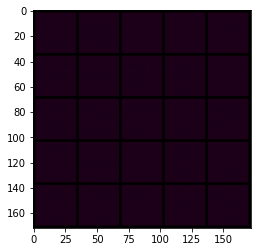

Training with cuda
EPOCH: 0



================= VALIDATION for EPOCH 0==================
-Overall losses:


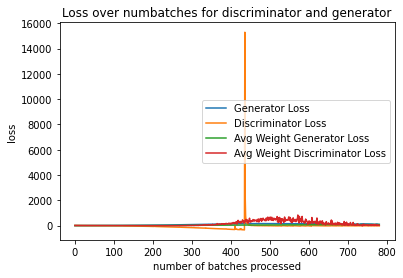

Showing Validation Images
Without averaging


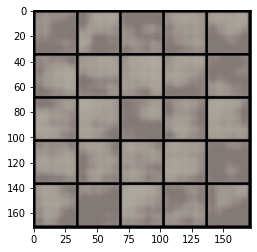

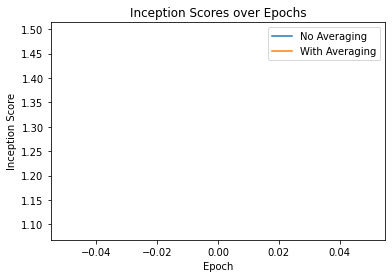

EPOCH: 1



================= VALIDATION for EPOCH 1==================
-Overall losses:


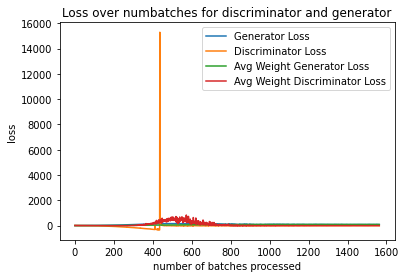

Showing Validation Images
With averaging


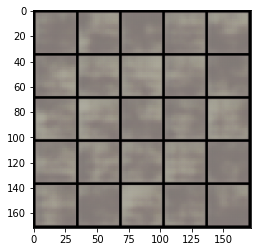

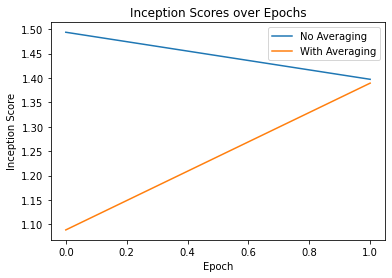

EPOCH: 2



================= VALIDATION for EPOCH 2==================
-Overall losses:


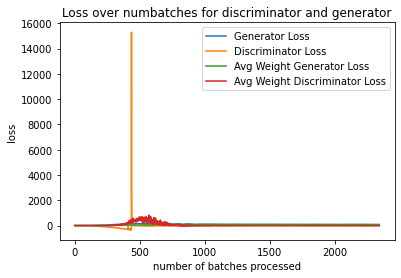

Showing Validation Images
Without averaging


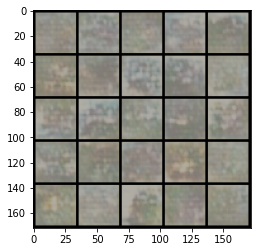

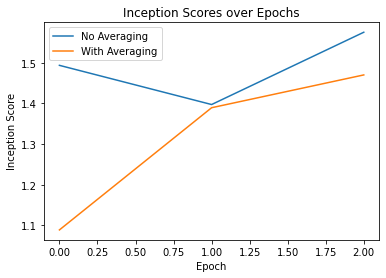

EPOCH: 3



================= VALIDATION for EPOCH 3==================
-Overall losses:


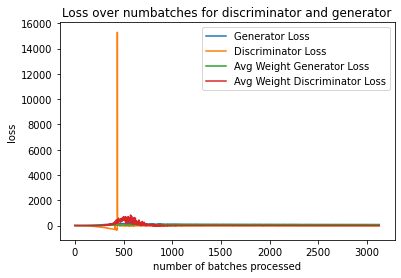

Showing Validation Images
With averaging


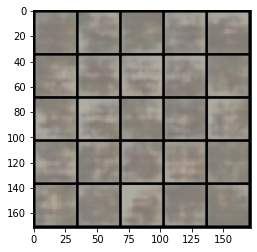

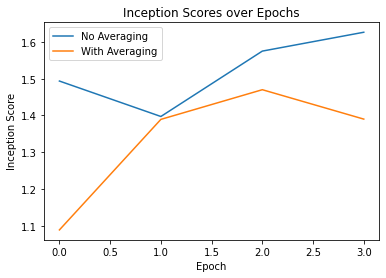

EPOCH: 4



================= VALIDATION for EPOCH 4==================
-Overall losses:


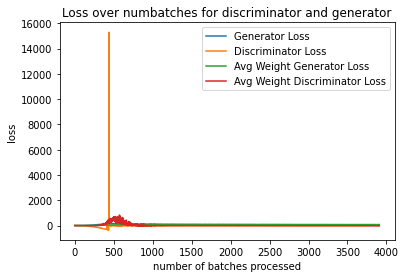

Showing Validation Images
Without averaging


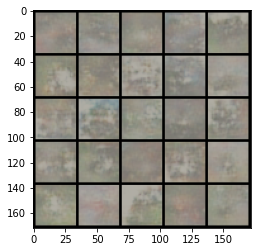

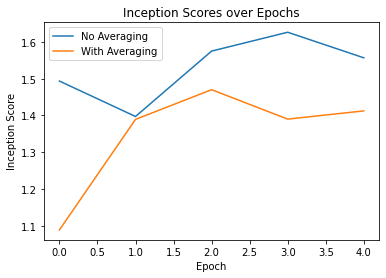

EPOCH: 5



================= VALIDATION for EPOCH 5==================
-Overall losses:


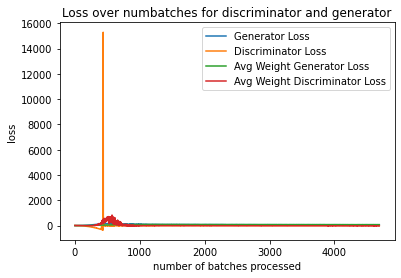

Showing Validation Images
With averaging


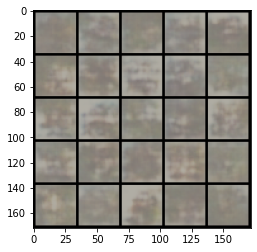

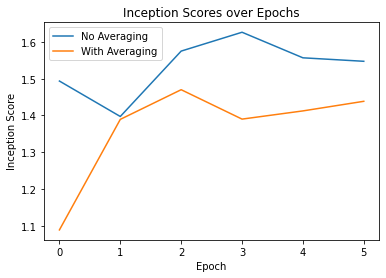

EPOCH: 6



================= VALIDATION for EPOCH 6==================
-Overall losses:


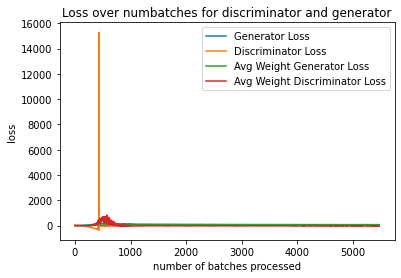

Showing Validation Images
Without averaging


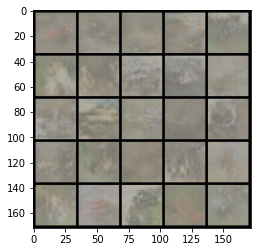

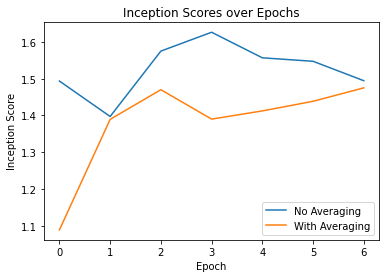

EPOCH: 7



================= VALIDATION for EPOCH 7==================
-Overall losses:


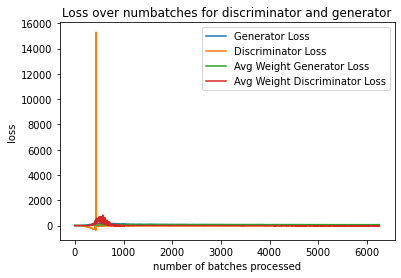

Showing Validation Images
With averaging


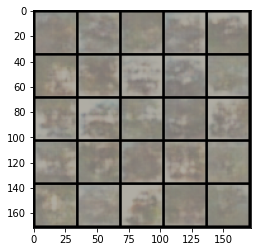

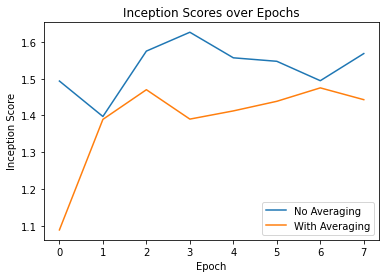

EPOCH: 8



================= VALIDATION for EPOCH 8==================
-Overall losses:


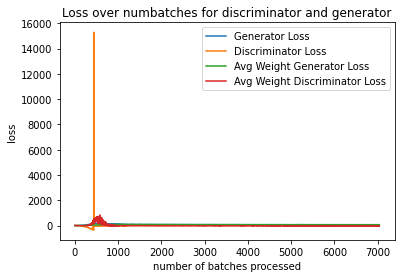

Showing Validation Images
Without averaging


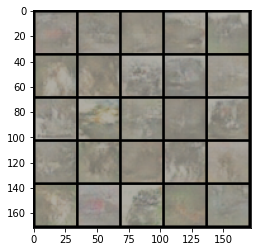

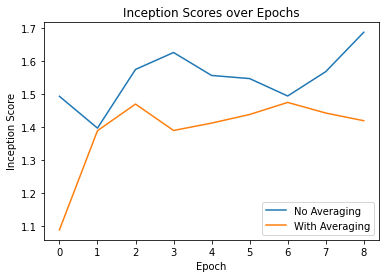

EPOCH: 9



================= VALIDATION for EPOCH 9==================
-Overall losses:


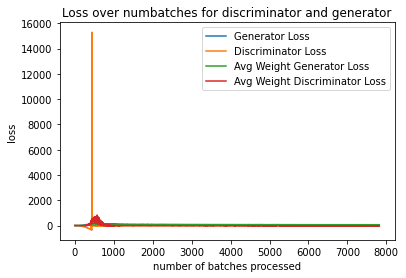

Showing Validation Images
With averaging


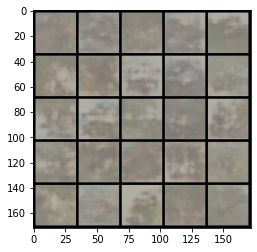

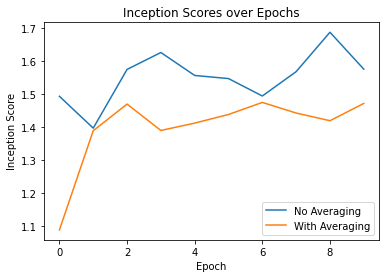

EPOCH: 10



================= VALIDATION for EPOCH 10==================
-Overall losses:


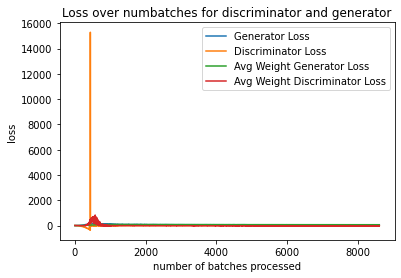

Showing Validation Images
Without averaging


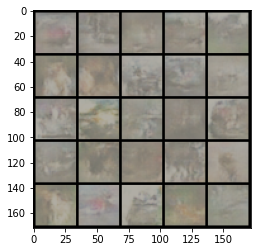

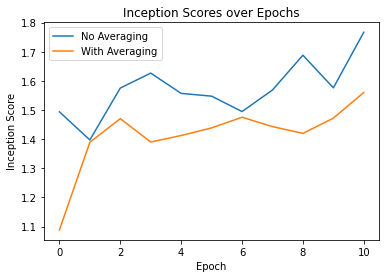

*** EPOCH 10 SAVING CHECKPOINTS AT /content/drive/My Drive/cs6140/gan_avgextraadam_batchnorm/[27-Nov-2020(13:23)]10avgextraAdam.pt ***
EPOCH: 11



================= VALIDATION for EPOCH 11==================
-Overall losses:


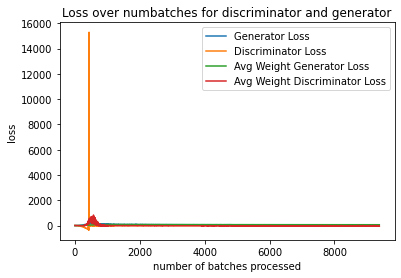

Showing Validation Images
With averaging


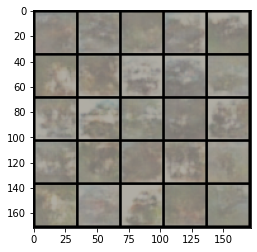

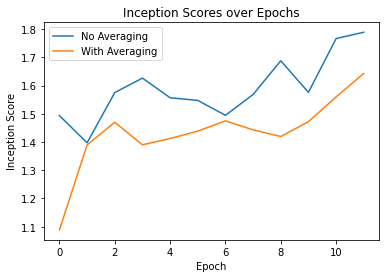

EPOCH: 12



================= VALIDATION for EPOCH 12==================
-Overall losses:


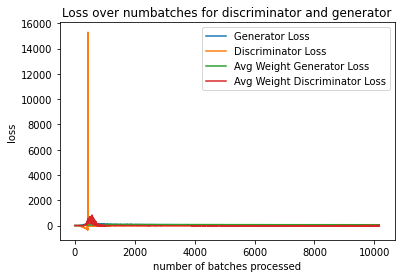

Showing Validation Images
Without averaging


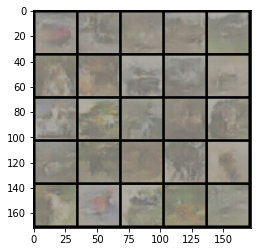

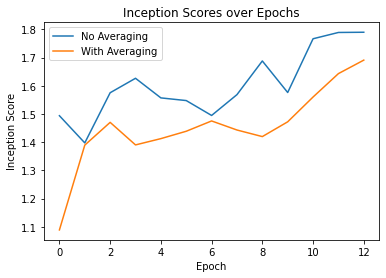

EPOCH: 13



================= VALIDATION for EPOCH 13==================
-Overall losses:


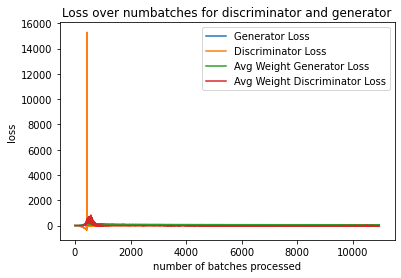

Showing Validation Images
With averaging


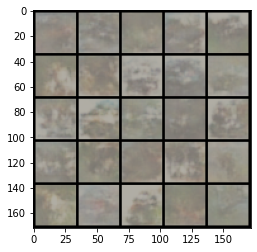

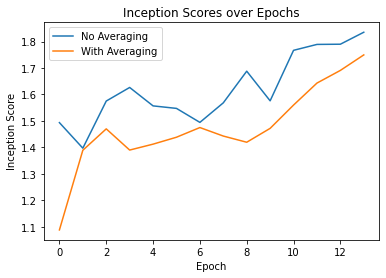

EPOCH: 14



================= VALIDATION for EPOCH 14==================
-Overall losses:


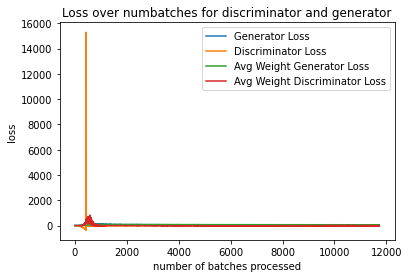

Showing Validation Images
Without averaging


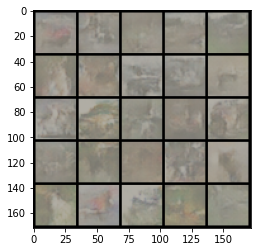

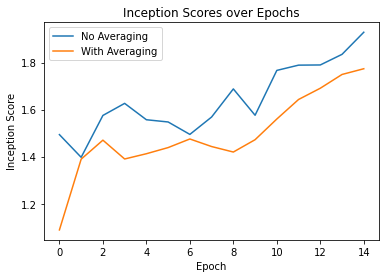

EPOCH: 15



================= VALIDATION for EPOCH 15==================
-Overall losses:


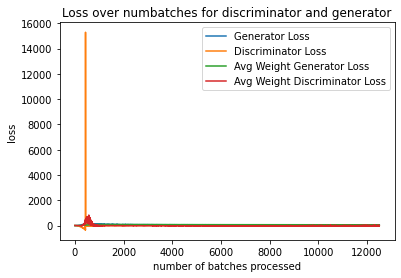

Showing Validation Images
With averaging


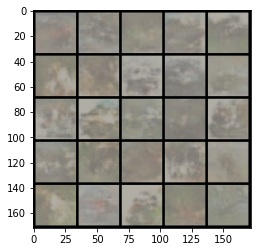

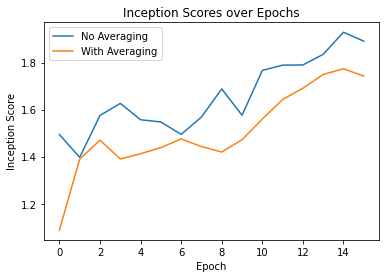

EPOCH: 16



================= VALIDATION for EPOCH 16==================
-Overall losses:


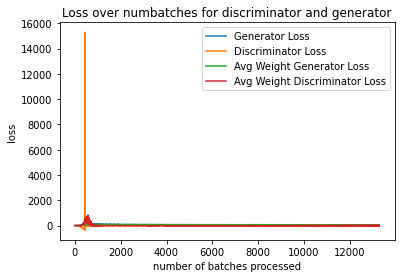

Showing Validation Images
Without averaging


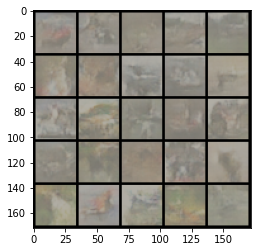

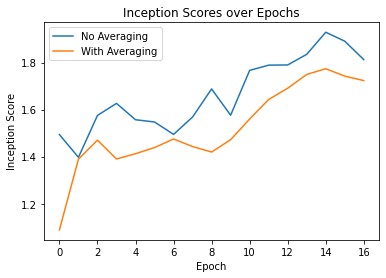

EPOCH: 17



================= VALIDATION for EPOCH 17==================
-Overall losses:


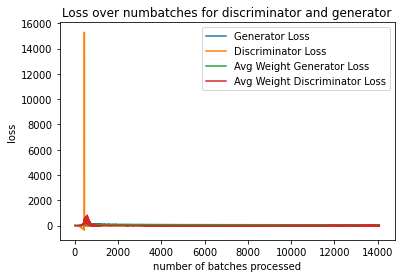

Showing Validation Images
With averaging


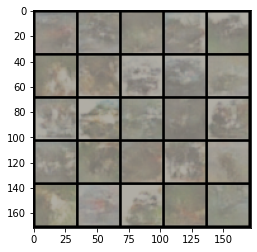

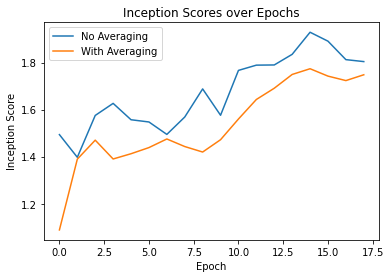

EPOCH: 18



================= VALIDATION for EPOCH 18==================
-Overall losses:


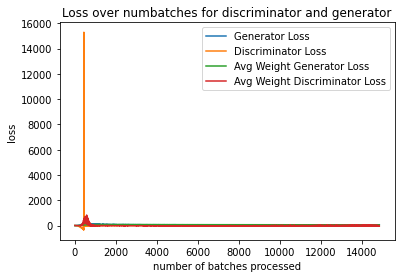

Showing Validation Images
Without averaging


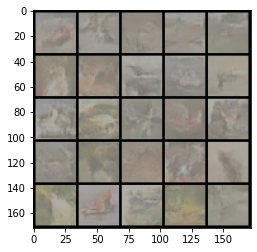

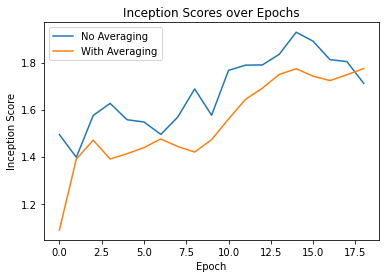

EPOCH: 19



================= VALIDATION for EPOCH 19==================
-Overall losses:


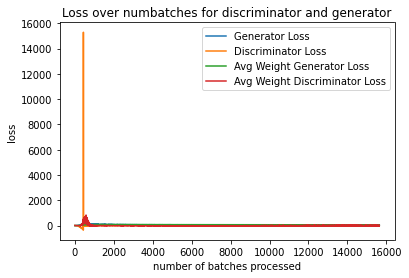

Showing Validation Images
With averaging


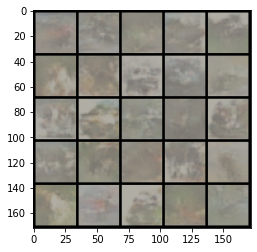

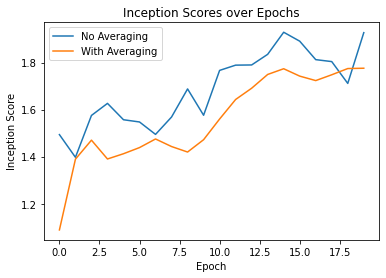

EPOCH: 20



================= VALIDATION for EPOCH 20==================
-Overall losses:


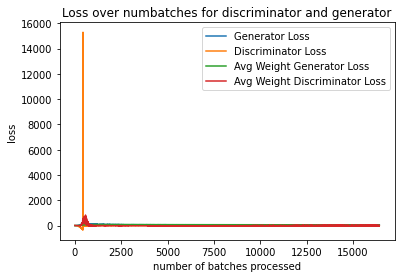

Showing Validation Images
Without averaging


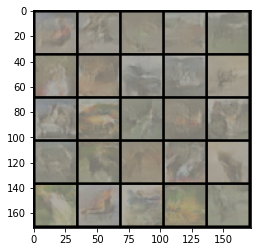

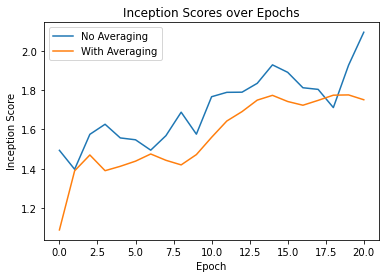

*** EPOCH 20 SAVING CHECKPOINTS AT /content/drive/My Drive/cs6140/gan_avgextraadam_batchnorm/[27-Nov-2020(13:46)]20avgextraAdam.pt ***
EPOCH: 21



================= VALIDATION for EPOCH 21==================
-Overall losses:


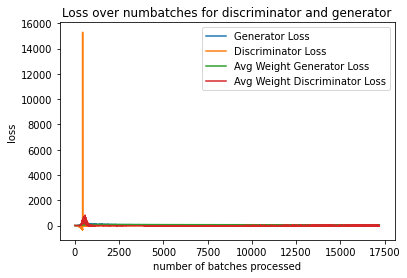

Showing Validation Images
With averaging


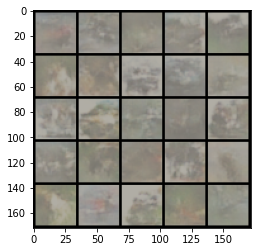

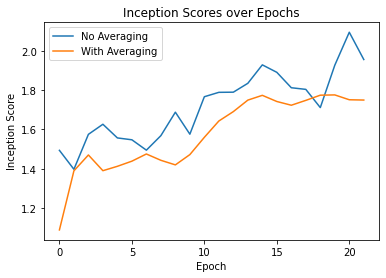

EPOCH: 22



================= VALIDATION for EPOCH 22==================
-Overall losses:


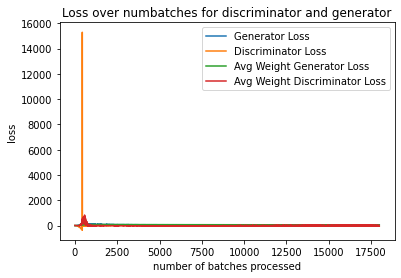

Showing Validation Images
Without averaging


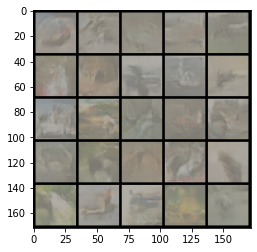

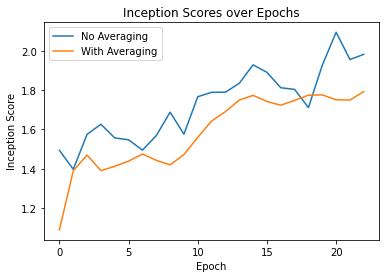

EPOCH: 23



================= VALIDATION for EPOCH 23==================
-Overall losses:


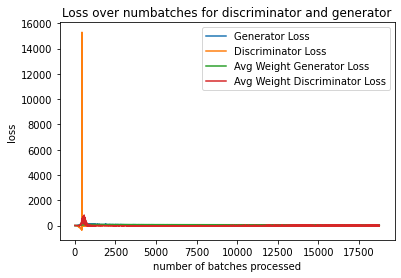

Showing Validation Images
With averaging


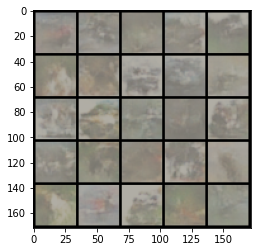

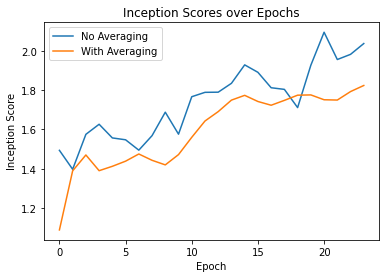

EPOCH: 24



================= VALIDATION for EPOCH 24==================
-Overall losses:


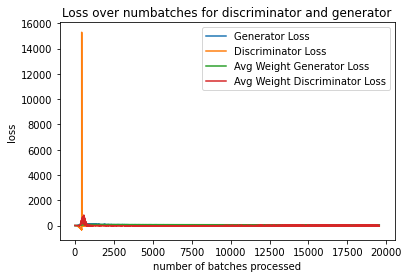

Showing Validation Images
Without averaging


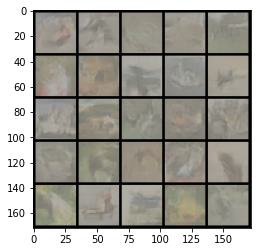

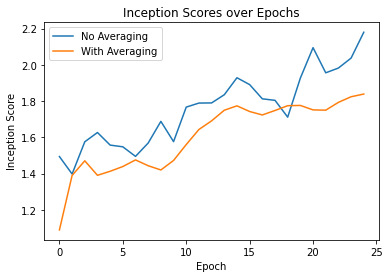

EPOCH: 25



================= VALIDATION for EPOCH 25==================
-Overall losses:


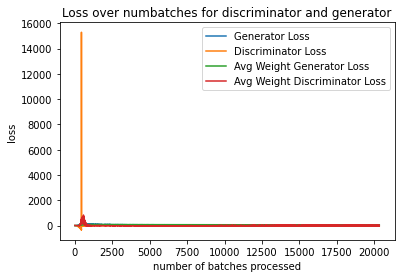

Showing Validation Images
With averaging


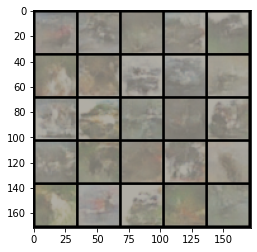

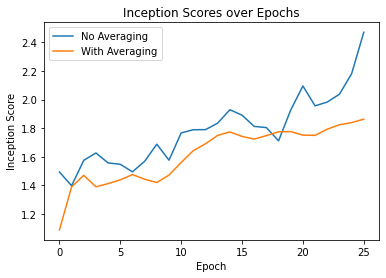

EPOCH: 26



================= VALIDATION for EPOCH 26==================
-Overall losses:


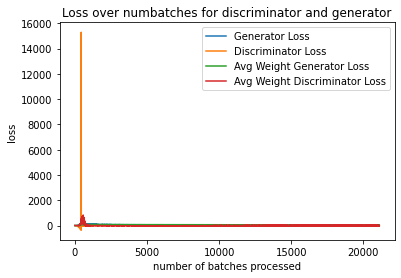

Showing Validation Images
Without averaging


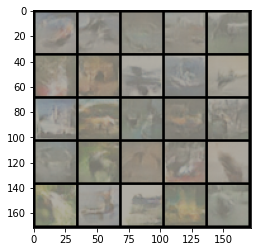

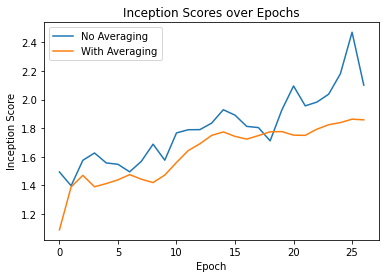

EPOCH: 27



================= VALIDATION for EPOCH 27==================
-Overall losses:


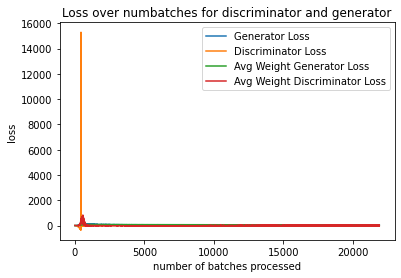

Showing Validation Images
With averaging


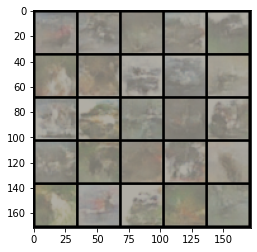

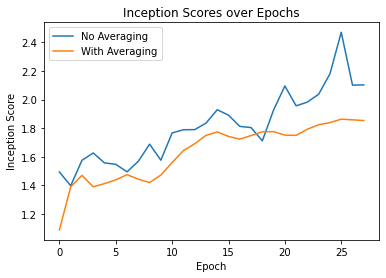

EPOCH: 28



================= VALIDATION for EPOCH 28==================
-Overall losses:


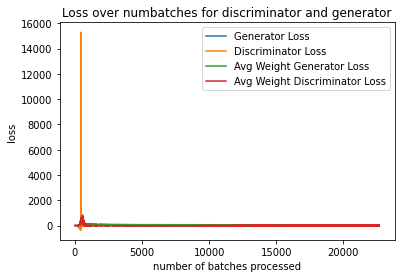

Showing Validation Images
Without averaging


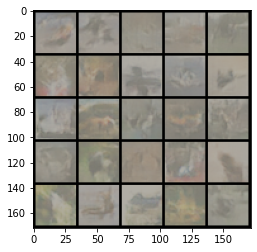

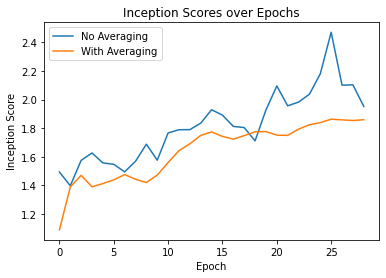

EPOCH: 29



================= VALIDATION for EPOCH 29==================
-Overall losses:


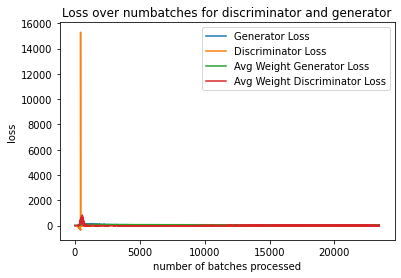

Showing Validation Images
With averaging


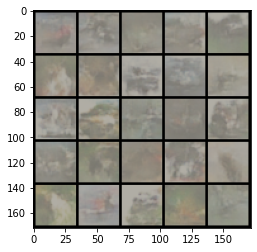

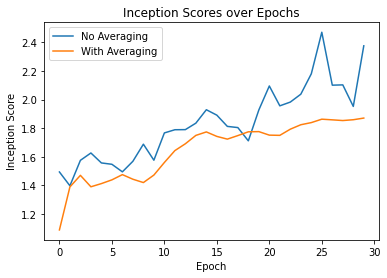

EPOCH: 30



================= VALIDATION for EPOCH 30==================
-Overall losses:


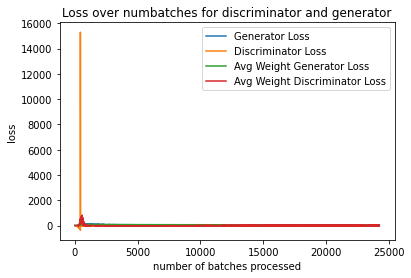

Showing Validation Images
Without averaging


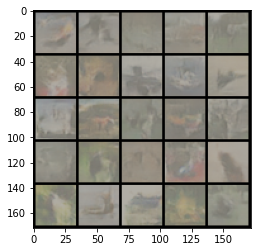

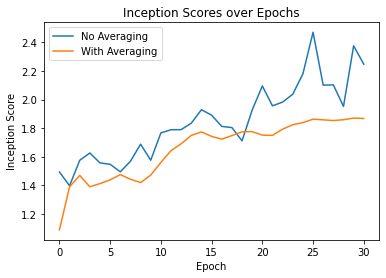

*** EPOCH 30 SAVING CHECKPOINTS AT /content/drive/My Drive/cs6140/gan_avgextraadam_batchnorm/[27-Nov-2020(14:08)]30avgextraAdam.pt ***
EPOCH: 31



================= VALIDATION for EPOCH 31==================
-Overall losses:


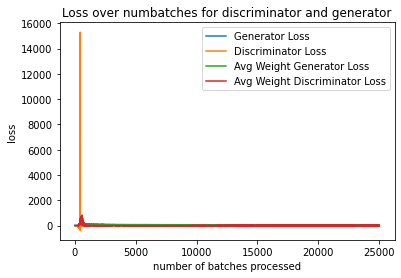

Showing Validation Images
With averaging


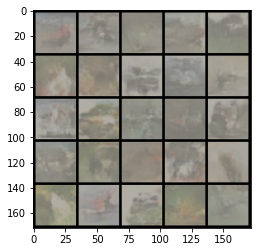

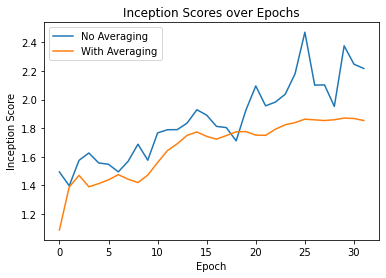

EPOCH: 32



================= VALIDATION for EPOCH 32==================
-Overall losses:


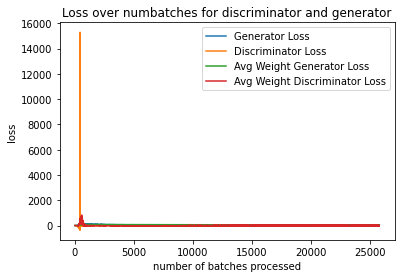

Showing Validation Images
Without averaging


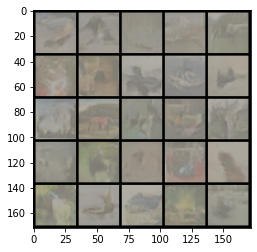

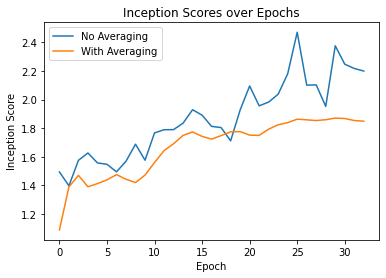

EPOCH: 33



================= VALIDATION for EPOCH 33==================
-Overall losses:


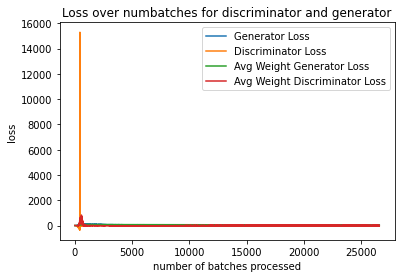

Showing Validation Images
With averaging


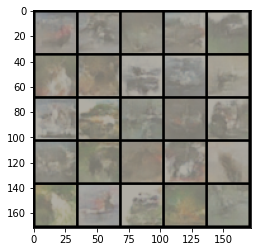

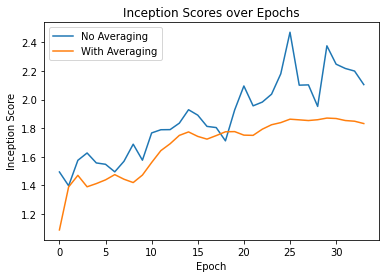

EPOCH: 34



================= VALIDATION for EPOCH 34==================
-Overall losses:


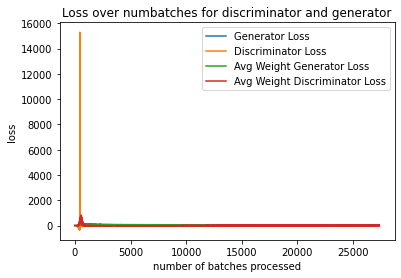

Showing Validation Images
Without averaging


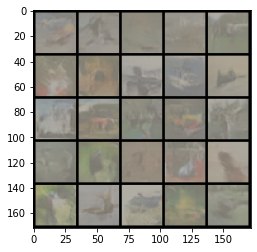

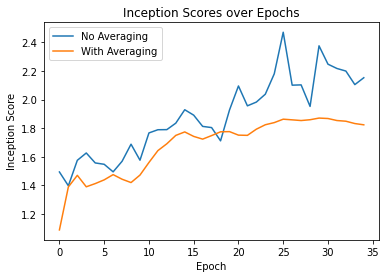

EPOCH: 35



================= VALIDATION for EPOCH 35==================
-Overall losses:


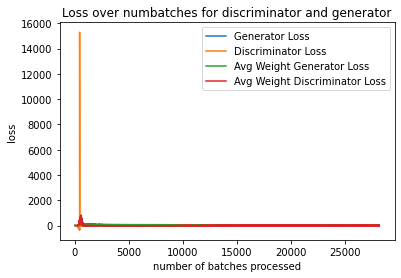

Showing Validation Images
With averaging


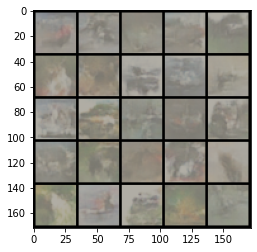

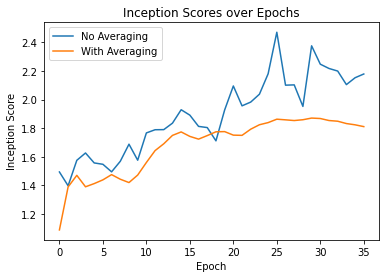

EPOCH: 36



================= VALIDATION for EPOCH 36==================
-Overall losses:


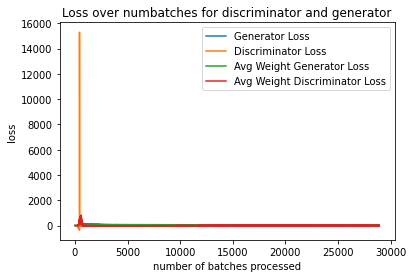

Showing Validation Images
Without averaging


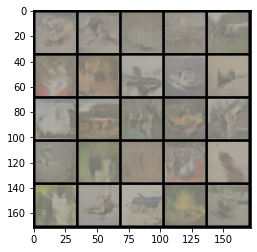

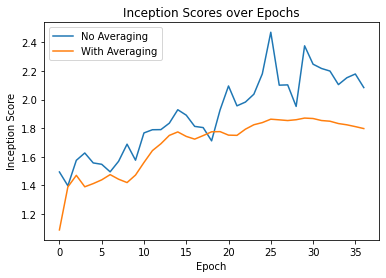

EPOCH: 37



================= VALIDATION for EPOCH 37==================
-Overall losses:


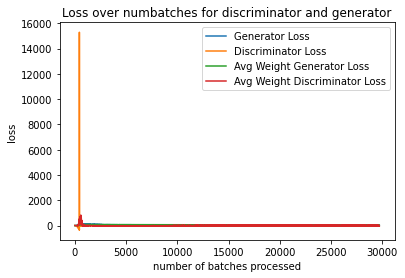

Showing Validation Images
With averaging


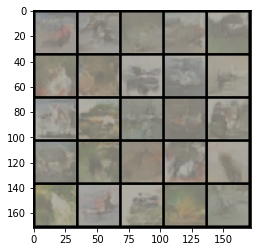

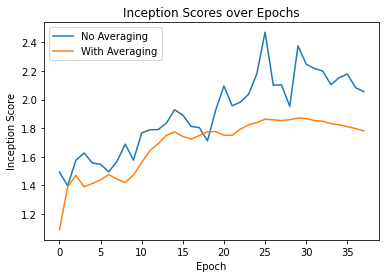

EPOCH: 38



================= VALIDATION for EPOCH 38==================
-Overall losses:


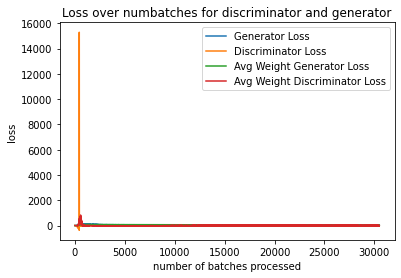

Showing Validation Images
Without averaging


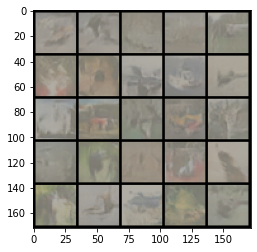

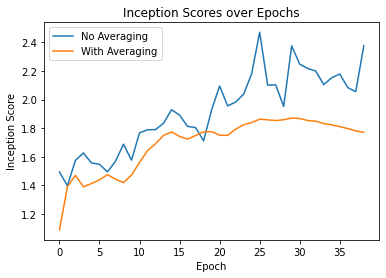

EPOCH: 39



================= VALIDATION for EPOCH 39==================
-Overall losses:


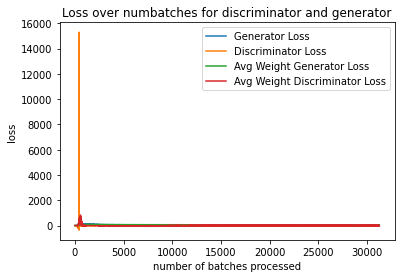

Showing Validation Images
With averaging


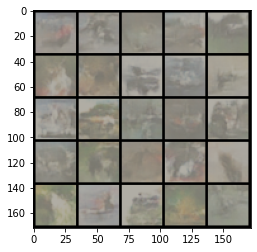

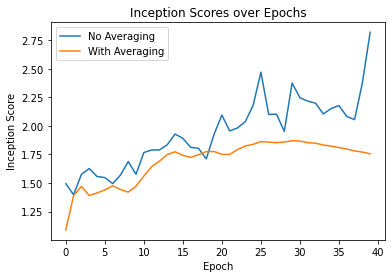

EPOCH: 40



================= VALIDATION for EPOCH 40==================
-Overall losses:


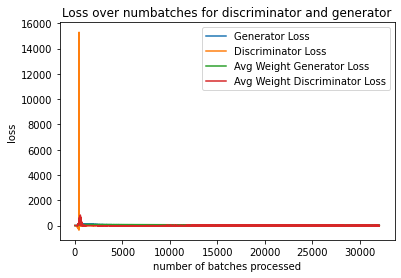

Showing Validation Images
Without averaging


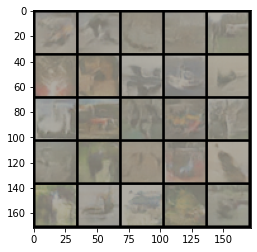

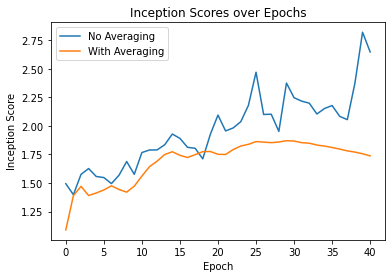

*** EPOCH 40 SAVING CHECKPOINTS AT /content/drive/My Drive/cs6140/gan_avgextraadam_batchnorm/[27-Nov-2020(14:30)]40avgextraAdam.pt ***
EPOCH: 41



================= VALIDATION for EPOCH 41==================
-Overall losses:


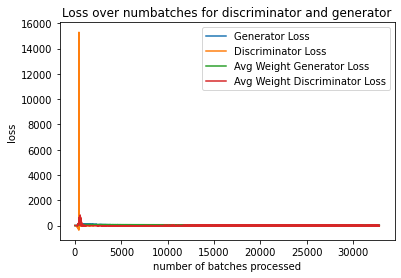

Showing Validation Images
With averaging


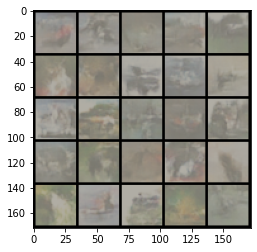

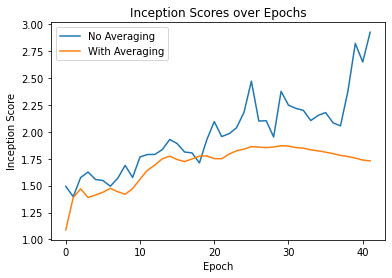

EPOCH: 42



================= VALIDATION for EPOCH 42==================
-Overall losses:


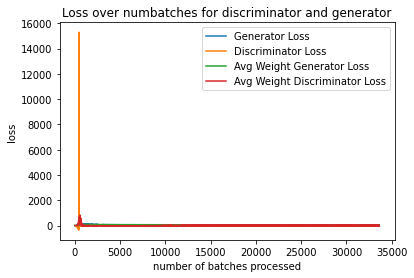

Showing Validation Images
Without averaging


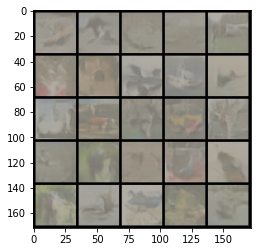

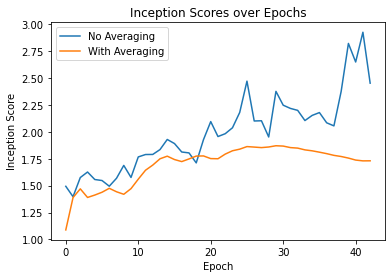

EPOCH: 43



================= VALIDATION for EPOCH 43==================
-Overall losses:


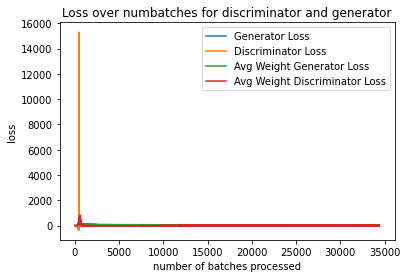

Showing Validation Images
With averaging


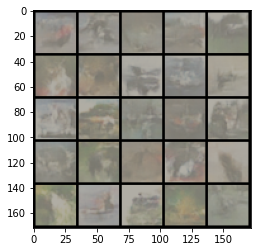

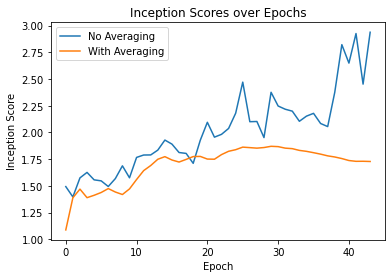

EPOCH: 44



================= VALIDATION for EPOCH 44==================
-Overall losses:


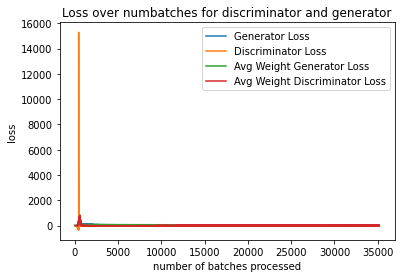

Showing Validation Images
Without averaging


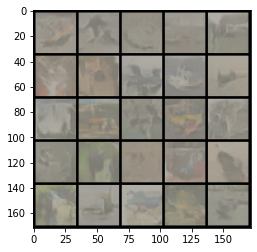

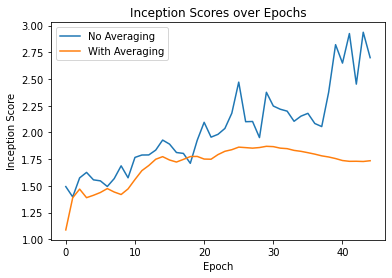

EPOCH: 45



================= VALIDATION for EPOCH 45==================
-Overall losses:


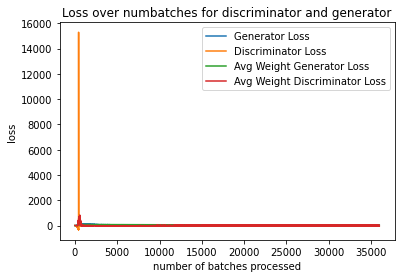

Showing Validation Images
With averaging


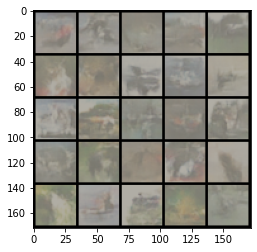

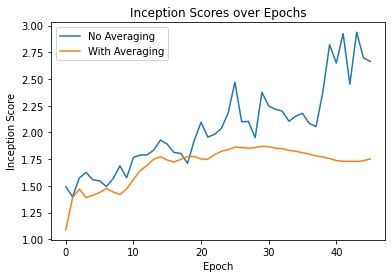

EPOCH: 46



================= VALIDATION for EPOCH 46==================
-Overall losses:


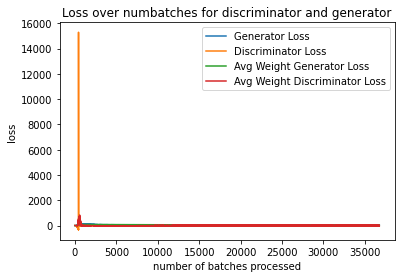

Showing Validation Images
Without averaging


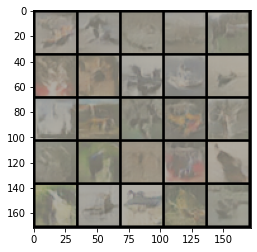

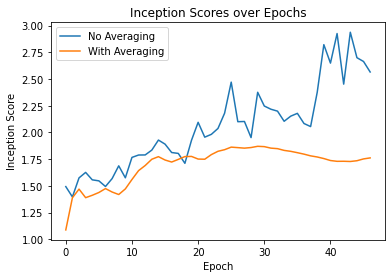

EPOCH: 47



================= VALIDATION for EPOCH 47==================
-Overall losses:


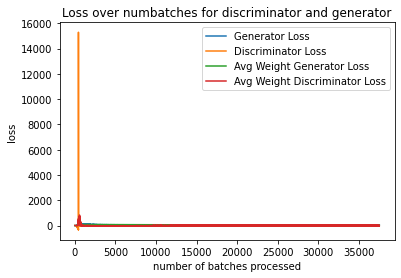

Showing Validation Images
With averaging


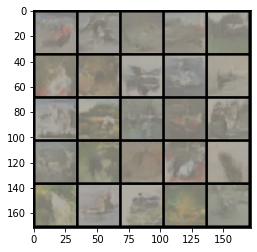

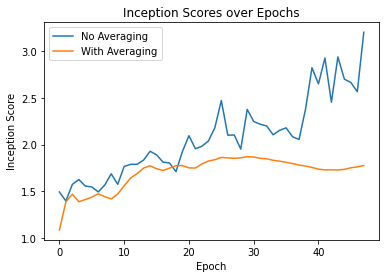

EPOCH: 48



================= VALIDATION for EPOCH 48==================
-Overall losses:


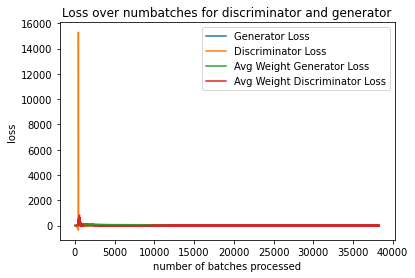

Showing Validation Images
Without averaging


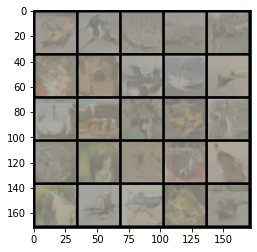

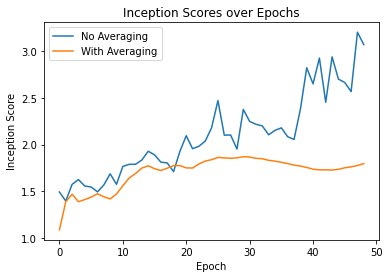

EPOCH: 49



================= VALIDATION for EPOCH 49==================
-Overall losses:


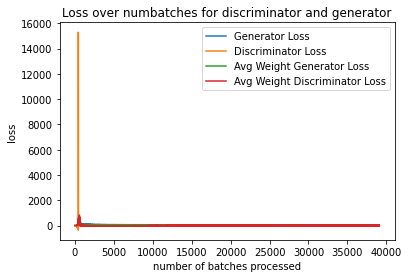

Showing Validation Images
With averaging


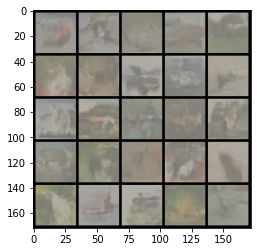

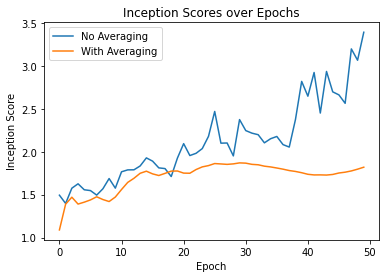

EPOCH: 50



================= VALIDATION for EPOCH 50==================
-Overall losses:


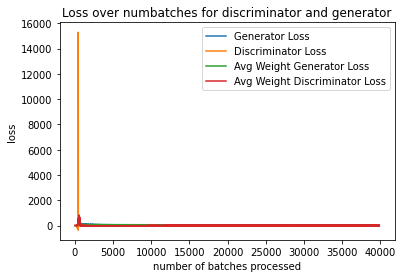

Showing Validation Images
Without averaging


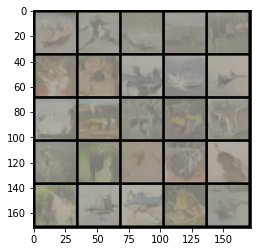

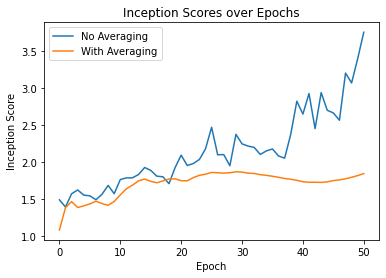

*** EPOCH 50 SAVING CHECKPOINTS AT /content/drive/My Drive/cs6140/gan_avgextraadam_batchnorm/[27-Nov-2020(14:53)]50avgextraAdam.pt ***
EPOCH: 51



================= VALIDATION for EPOCH 51==================
-Overall losses:


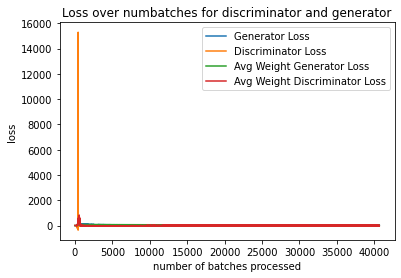

Showing Validation Images
With averaging


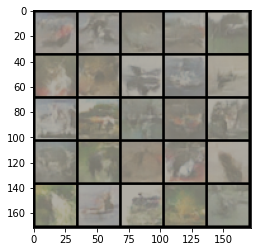

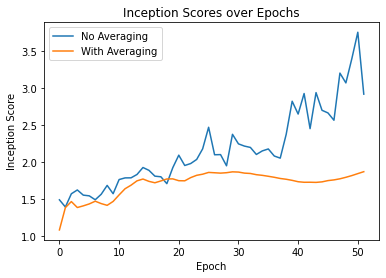

EPOCH: 52



================= VALIDATION for EPOCH 52==================
-Overall losses:


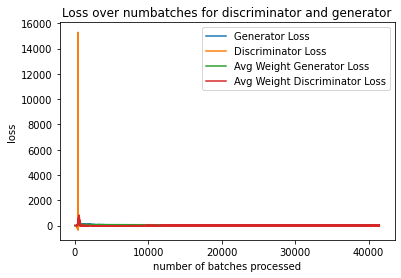

Showing Validation Images
Without averaging


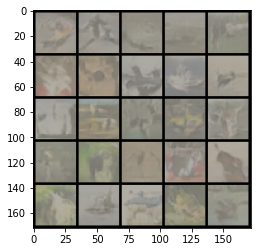

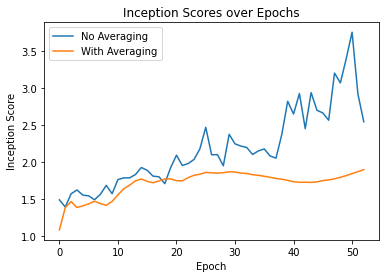

EPOCH: 53



================= VALIDATION for EPOCH 53==================
-Overall losses:


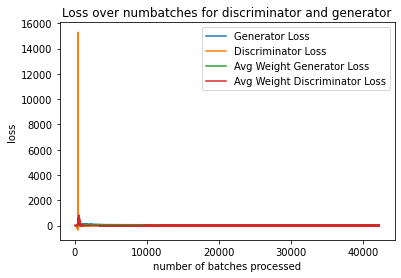

Showing Validation Images
With averaging


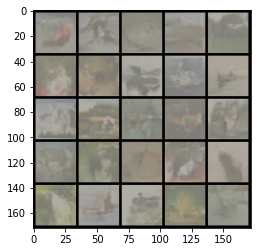

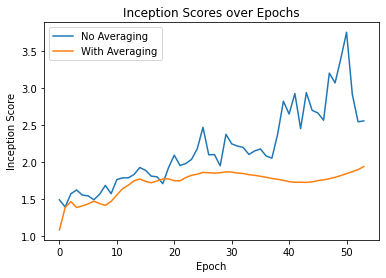

EPOCH: 54



================= VALIDATION for EPOCH 54==================
-Overall losses:


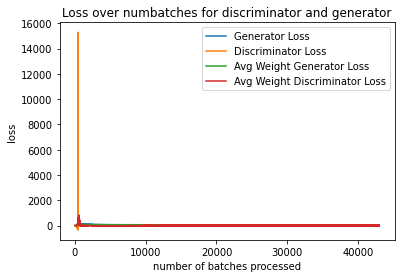

Showing Validation Images
Without averaging


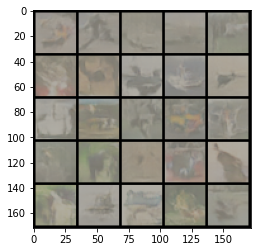

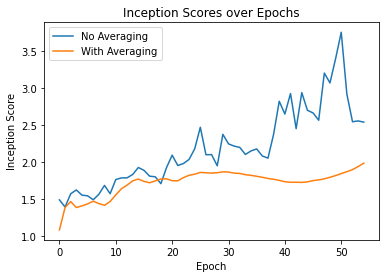

EPOCH: 55



================= VALIDATION for EPOCH 55==================
-Overall losses:


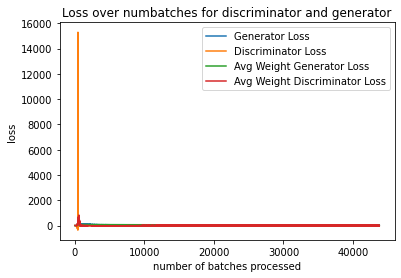

Showing Validation Images
With averaging


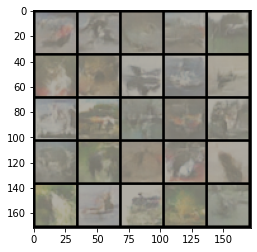

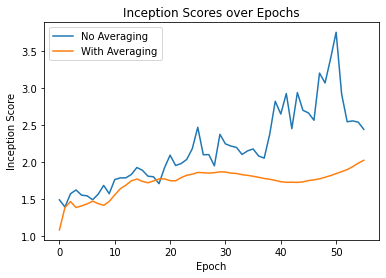

EPOCH: 56



================= VALIDATION for EPOCH 56==================
-Overall losses:


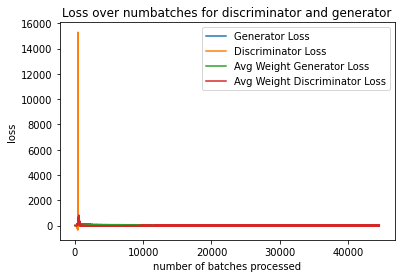

Showing Validation Images
Without averaging


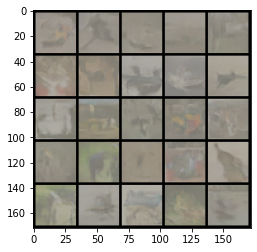

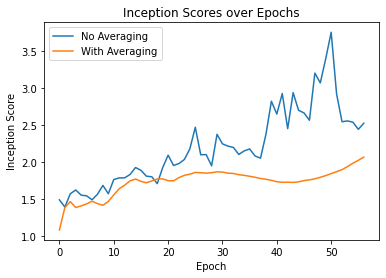

EPOCH: 57



================= VALIDATION for EPOCH 57==================
-Overall losses:


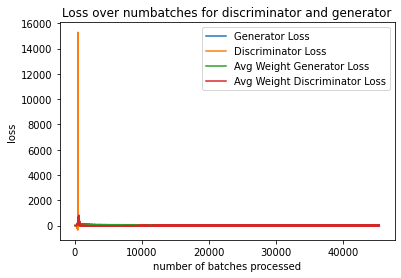

Showing Validation Images
With averaging


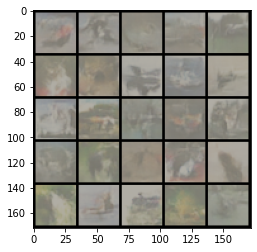

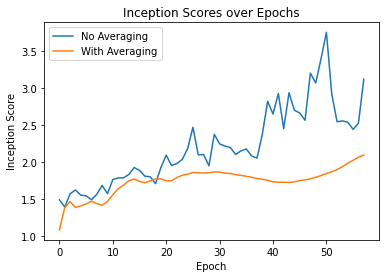

EPOCH: 58



================= VALIDATION for EPOCH 58==================
-Overall losses:


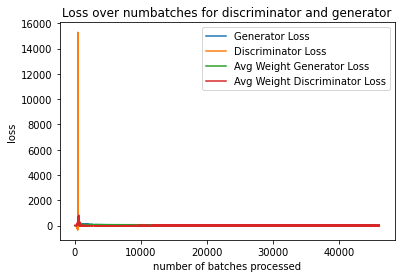

Showing Validation Images
Without averaging


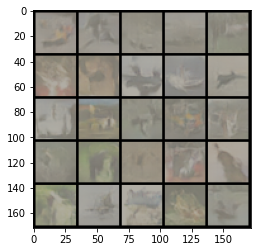

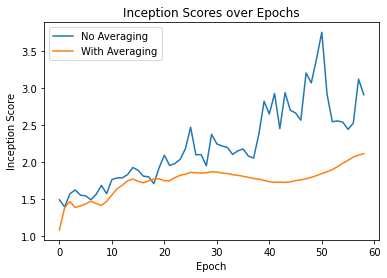

EPOCH: 59



================= VALIDATION for EPOCH 59==================
-Overall losses:


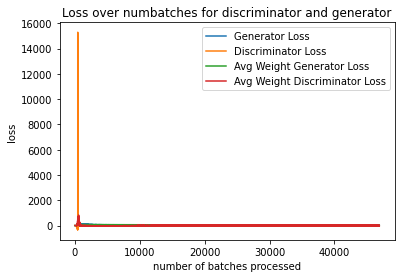

Showing Validation Images
With averaging


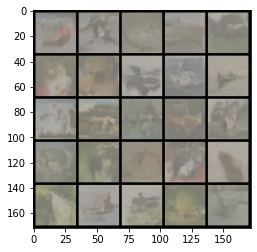

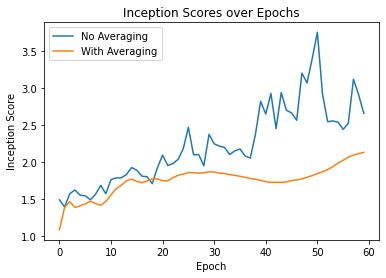

EPOCH: 60



================= VALIDATION for EPOCH 60==================
-Overall losses:


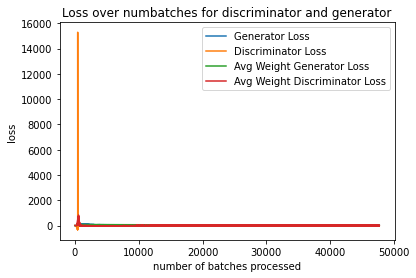

Showing Validation Images
Without averaging


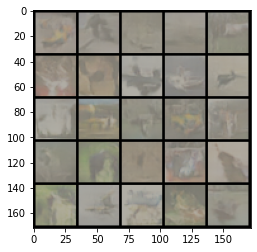

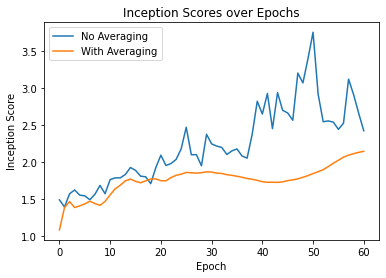

*** EPOCH 60 SAVING CHECKPOINTS AT /content/drive/My Drive/cs6140/gan_avgextraadam_batchnorm/[27-Nov-2020(15:15)]60avgextraAdam.pt ***
EPOCH: 61



================= VALIDATION for EPOCH 61==================
-Overall losses:


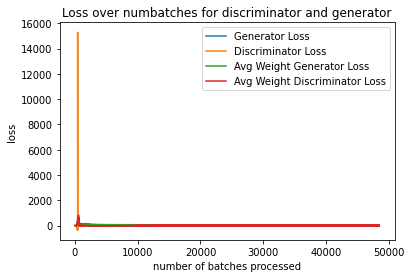

Showing Validation Images
With averaging


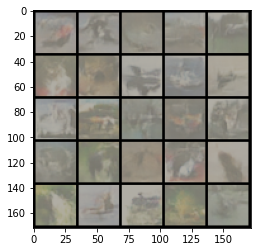

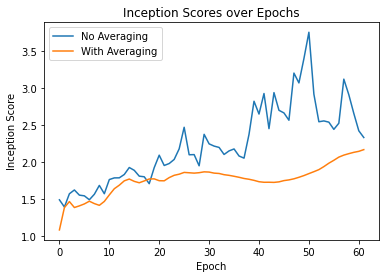

EPOCH: 62



================= VALIDATION for EPOCH 62==================
-Overall losses:


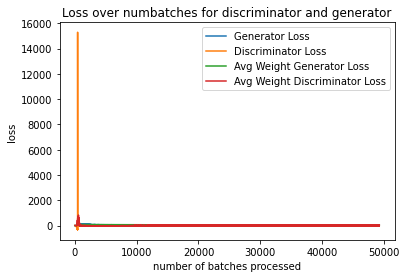

Showing Validation Images
Without averaging


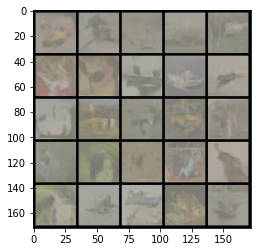

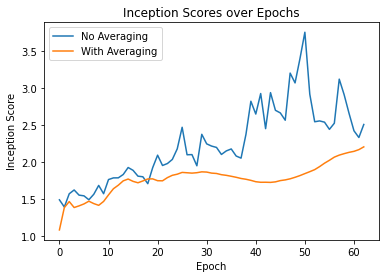

EPOCH: 63



================= VALIDATION for EPOCH 63==================
-Overall losses:


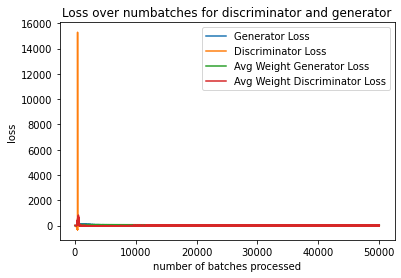

Showing Validation Images
With averaging


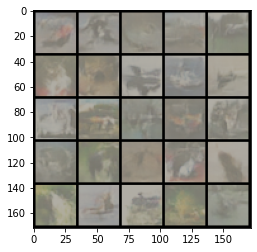

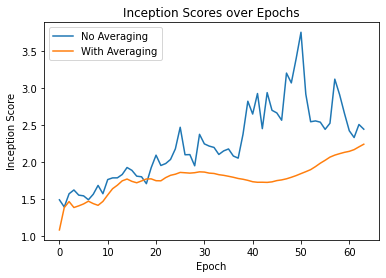

EPOCH: 64



================= VALIDATION for EPOCH 64==================
-Overall losses:


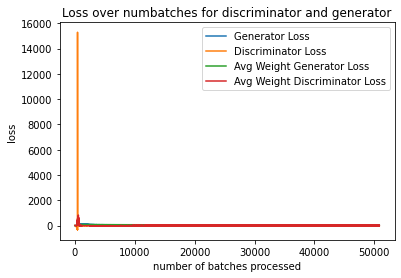

Showing Validation Images
Without averaging


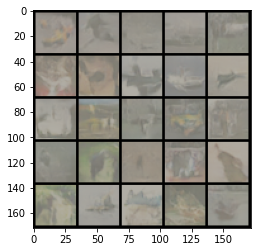

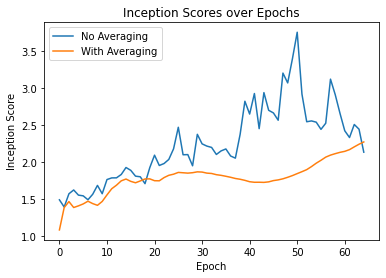

EPOCH: 65



================= VALIDATION for EPOCH 65==================
-Overall losses:


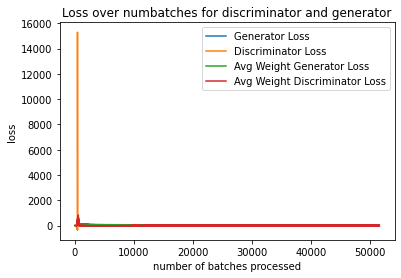

Showing Validation Images
With averaging


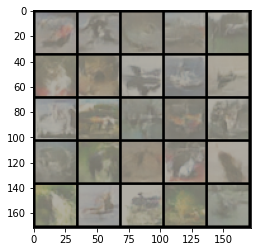

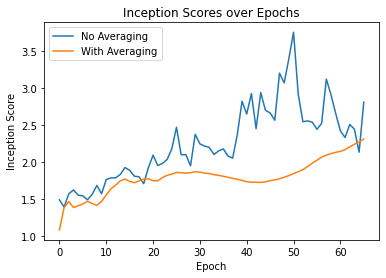

EPOCH: 66



================= VALIDATION for EPOCH 66==================
-Overall losses:


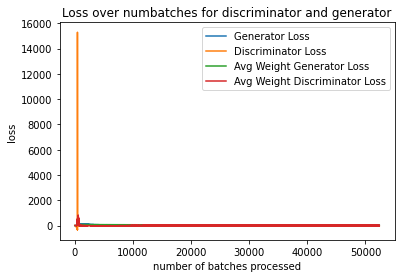

Showing Validation Images
Without averaging


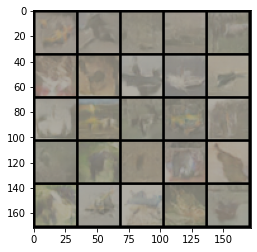

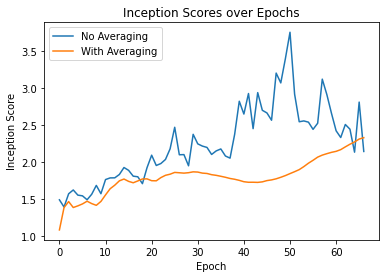

EPOCH: 67



================= VALIDATION for EPOCH 67==================
-Overall losses:


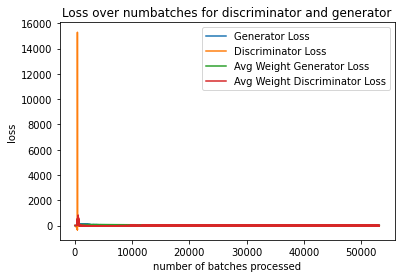

Showing Validation Images
With averaging


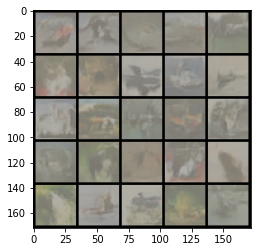

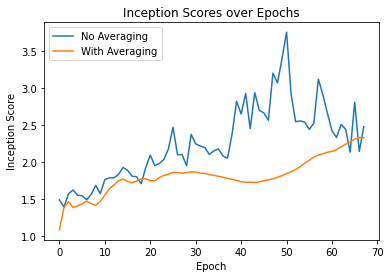

EPOCH: 68



================= VALIDATION for EPOCH 68==================
-Overall losses:


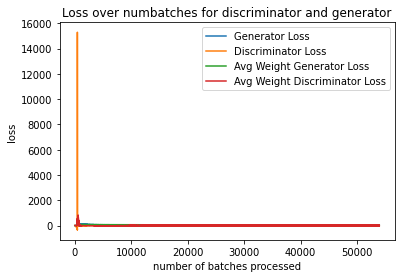

Showing Validation Images
Without averaging


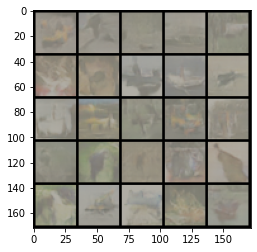

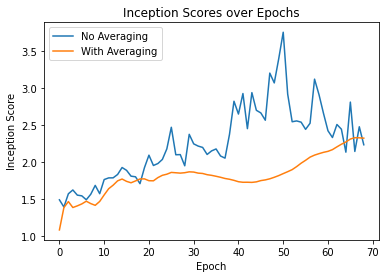

EPOCH: 69



================= VALIDATION for EPOCH 69==================
-Overall losses:


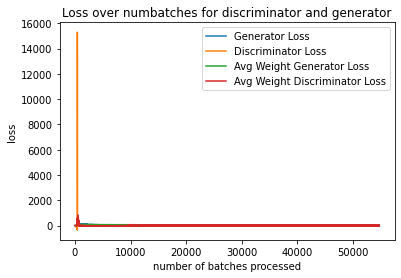

Showing Validation Images
With averaging


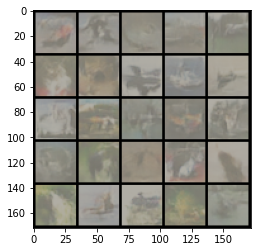

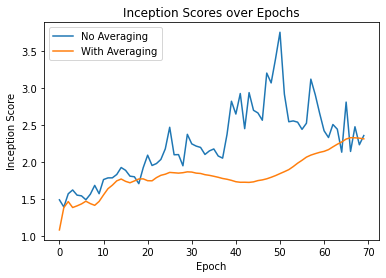

EPOCH: 70



================= VALIDATION for EPOCH 70==================
-Overall losses:


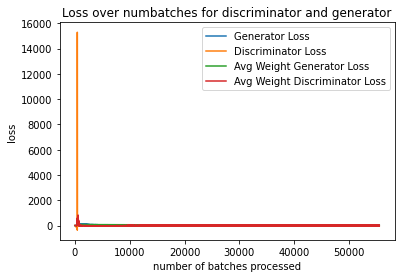

Showing Validation Images
Without averaging


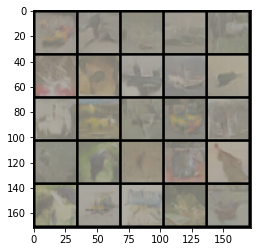

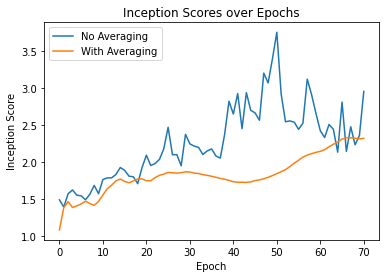

*** EPOCH 70 SAVING CHECKPOINTS AT /content/drive/My Drive/cs6140/gan_avgextraadam_batchnorm/[27-Nov-2020(15:37)]70avgextraAdam.pt ***
EPOCH: 71


KeyboardInterrupt: ignored

In [25]:
import copy

# =========================================================================== #
#                  FITTING                                                    #
# =========================================================================== #
display_step = 500  # for displaying info after this many step (i.e. batch)
disc_repeats = 5  # how many times to train the discriminator per one generator
check_point_after_epochs = 10  # checkpointing every these epochs
n_epochs = 501


def fit(checkpt=True, loadcheckptpath=None, checkpoint_name_tag="avgextraAdam.pt"):
	""" fit the models gen, disc in global var
	CHECKPOINT_NAME_TAG specifies the naming for the checkpoint file
	"""
	# ================================================================== #
	#       Initialize training vars                                     #
	# ================================================================== #
	step = 0
	generator_losses = []
	disc_losses = []
	inception_scores = []
	avgmodel_inception_scores = []
	img_history = []
	avgmodel_image_history = []
	last_epoch = 0
	gen2_losses = []
	disc2_losses = []

	# ================================================================== #
	#               Load checkpts if any                                 #
	# ================================================================== #
	if loadcheckptpath is not None:  # we were provided with checkpt. Load and resume
		print(f"========= Checkpoint found! Resuming training from last checkpoint at ======== \n{loadcheckptpath}")
		print("Loading checkpoint...")
		checkpoint = torch.load(loadcheckptpath)
		print("Checkpoint loaded successfully! Info:")
		last_epoch = checkpoint['epoch'] + 1
		print(f"\tLast epoch: {last_epoch - 1}")
		disc.load_state_dict(checkpoint['disc_state_dict'])
		gen.load_state_dict(checkpoint['gen_state_dict'])
		disc2.load_state_dict(checkpoint['disc2_state_dict'])
		gen2.load_state_dict(checkpoint['gen2_state_dict'])
		disc_opt.load_state_dict(checkpoint['disc_opt_state_dict'])
		gen_opt.load_state_dict(checkpoint['gen_opt_state_dict'])
		print(f"\tLoaded discriminator and generator's old weight and state_dict")
		generator_losses = checkpoint['generator_losses']
		disc_losses = checkpoint['disc_losses']
		gen2_losses = checkpoint['gen2_losses']
		disc2_losses = checkpoint['disc2_losses']
		print(f"\tLoaded losses history.")
		step = checkpoint['step']
		print(f"\tLast step: {step}")
		img_history = checkpoint['img_history']
		inception_scores = checkpoint['inception_scores']
		avgmodel_image_history = checkpoint['avgmodel_image_history']
		avgmodel_inception_scores = checkpoint['avgmodel_inception_scores']
		print("Loaded img_history and inception_scores")
		print("===================== FINISHED LOADING LAST CHECKPOINT. TRAINING ===========")
	else:
		print("Checkpoint not found. Below is the first image with the validation noise.")
		firstimg = gen(validation_noise)
		show_tensor_images(firstimg)
		img_history += [firstimg]

	# ==================== BEGIN TRAINING ==================== #
	print("Training with", device)
	for epoch in range(last_epoch, n_epochs):
		# make sure the models are set to training
		gen.train()
		disc.train()
		print(f"EPOCH: {epoch}")
		# Dataloader returns the batches
		# Here, we sample two batches: one for extrapolation and one for gradient computation
		for (real1, label1), (real2, label2) in tqdm(zip(trainset, trainset2), total=len(trainset)):
			# tqdm is just a progress bar
			cur_batch_size = len(real1)
			real1 = real1.to(device)  # load to GPU if enabled
			real2 = real2.to(device)

			# ================================================================== #
			#                      EXTRAPOLATED STEP                             #
			# ================================================================== #
			# We save the original weights for later update
			disc_saved_state = copy.deepcopy(disc.state_dict())
			discopt_saved_state = copy.deepcopy(disc_opt.state_dict())
			gen_saved_state = copy.deepcopy(gen.state_dict())
			genopt_saved_state = copy.deepcopy(gen_opt.state_dict())

			# ===== First, we compute the extrapolation weights to compute the gradients on using the curr. weights ====
			# first zero out the grad
			disc_opt.zero_grad()
			# now compute the loss
			# first, we generate fake images and compute the loss based on the given loss fn
			noise = make_noise(cur_batch_size, z_dim, device=device)
			fake1 = gen(noise)
			# compute the loss (loss fn set above)
			disc_loss = disc_loss_fn(disc, real1, fake1, device, c_lambda)
			# Get gradients
			disc_loss.backward(retain_graph=True)

			# Load the extrapolated weights into our discriminator
			disc_opt.step()

			# ===== now, we do the same for the generator =====
			# first zero out the gradients
			gen_opt.zero_grad()
			# then generate some fake images
			morenoise = make_noise(cur_batch_size, z_dim, device=device)
			fake2 = gen(morenoise)
			# compute the scores and losses
			fake_score = disc(fake2)
			gen_loss = gen_loss_fn(fake_score)
			# compute the gradients
			gen_loss.backward()

			# Load the extrapolated weights into our discriminator generator. Must recover later with the saved states
			gen_opt.step()

			# ================================================================== #
			#       Obtain the extrapolated gradients for discriminator          #
			# ================================================================== #
			# we do it again but with the second mini batch and the extrapolated weights now
			# first zero out the grad
			disc_opt.zero_grad()
			# generate fake images again and compute the loss based on the given loss fn
			noise = make_noise(cur_batch_size, z_dim, device=device)
			fake = gen(noise)
			# compute the loss on the second batch (real2) and the extrapolated weight now
			disc_loss = disc_loss_fn(disc, real2, fake, device, c_lambda)
			# compute the gradient
			disc_loss.backward(retain_graph=True)
			# now the gradients is stored in the .grad of the parameters in this extrapolated disc
			# we set the just the weights back to before to optimize
			disc_opt.load_state_dict(discopt_saved_state)  # more sneaky move
			for name, p in disc.named_parameters():
				p.data = disc_saved_state[name].data  # sneaky move
			# add the loss to loss history
			disc_losses += [disc_loss.item()]
			disc_opt.step()

			# ================================================================== #
			#       Obtain the extrapolated gradients for generator              #
			# ================================================================== #
			# first zero out the gradients
			gen_opt.zero_grad()
			# then generate some fake images
			morenoise = make_noise(cur_batch_size, z_dim, device=device)
			fake = gen(morenoise)
			# compute the scores and losses
			fake_score = disc(fake)
			gen_loss = gen_loss_fn(fake_score)
			# compute the gradients on the extrapolated weights
			gen_loss.backward()
			# now the gradients is stored in the .grad of the parameters in this extrapolated disc
			# we set the just the weights back to before to optimize
			gen_opt.load_state_dict(genopt_saved_state)  # more sneaky move
			for name, p in gen.named_parameters():
				p.data = gen_saved_state[name].data  # sneaky move
			# Keep track of the generator loss
			generator_losses += [gen_loss.item()]
			gen_opt.step()  # sneaky move gets run here

			step += 1

			# ================================================================== #
			#                               Average                              #
			# ================================================================== #
			# compute the loss for the averaged disc
			noise = make_noise(cur_batch_size, z_dim, device=device)
			fake = gen2(noise)
			disc2_loss = disc_loss_fn(disc2, real1, fake, device, c_lambda)
			disc2_losses += [disc2_loss.item()]
			fake_score = disc2(fake)
			gen2_loss = gen_loss_fn(fake_score)
			gen2_losses += [gen2_loss.item()]

			# update the avg weights
			with torch.no_grad():
				for name, p in disc.named_parameters():
					q = disc2.state_dict()[name]
					q = ((step - 1) * q + p) / step
					new_state_dict = {name: q}
					disc2.load_state_dict(new_state_dict, strict=False)

			with torch.no_grad():
				for name, p in gen.named_parameters():
					q = gen2.state_dict()[name]
					q = ((step - 1) * q + p) / step
					new_state_dict = {name: q}
					gen2.load_state_dict(new_state_dict, strict=False)

		# ================================================================== #
		#                       Validation                                   #
		# ================================================================== #
		gen.eval()
		disc.eval()
		print(f"================= VALIDATION for EPOCH {epoch}==================")
		print("-Overall losses:")
		# plot total losses after each epoch
		plt.plot(
			# range(num_examples // step_bins),
			# torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
			range(len(generator_losses)),
			generator_losses,
			label="Generator Loss"
		)
		plt.plot(
			# range(num_examples // step_bins),
			# torch.Tensor(disc_losses[:num_examples]).view(-1, step_bins).mean(1),
			range(len(disc_losses)),
			disc_losses,
			label="Discriminator Loss"
		)
		# plot the avg weight models' losses
		plt.plot(
			# range(num_examples // step_bins),
			# torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
			range(len(gen2_losses)),
			gen2_losses,
			label="Avg Weight Generator Loss"
		)
		plt.plot(
			# range(num_examples // step_bins),
			# torch.Tensor(disc_losses[:num_examples]).view(-1, step_bins).mean(1),
			range(len(disc2_losses)),
			disc2_losses,
			label="Avg Weight Discriminator Loss"
		)
		plt.ylabel('loss')
		plt.xlabel('number of batches processed')
		plt.title('Loss over numbatches for discriminator and generator')
		plt.legend()
		plt.show()

		print("Showing Validation Images")
		valimg = gen(validation_noise)
		avgmodel_valimg = gen2(validation_noise)
		if epoch %2 == 0:
			print("Without averaging")
			show_tensor_images(valimg, unnorm_mean = (0.4914, 0.4822, 0.4465), unnorm_var=(0.2023, 0.1994, 0.2010))
		else:
			print("With averaging")
			show_tensor_images(avgmodel_valimg, unnorm_mean = (0.4914, 0.4822, 0.4465), unnorm_var=(0.2023, 0.1994, 0.2010))
		img_history += [valimg]
		avgmodel_image_history += [avgmodel_valimg]
		# print("Showing Images Generated by Random Input")
		# show_tensor_images(gen(make_noise(25, z_dim, device=device)))

		# === We validate our progress by measuring inception score on "validation noise" that we fixed in the beginning =====
		incept_score = inception_score(valimg, cuda=True, batch_size=batch_size, resize=True, n_sec=1)[0]
		avgmodel_incept_score = inception_score(avgmodel_valimg, cuda=True, batch_size=batch_size, resize=True, n_sec=1)[0]
		inception_scores.append(incept_score)
		avgmodel_inception_scores.append(avgmodel_incept_score)
		plt.plot(
			range(len(inception_scores)),
			inception_scores,
			label="No Averaging"
		)
		plt.plot(
			range(len(avgmodel_inception_scores)),
			avgmodel_inception_scores,
			label="With Averaging"
		)
		plt.xlabel("Epoch")
		plt.ylabel("Inception Score")
		plt.title("Inception Scores over Epochs")
		plt.legend()
		plt.show()

		# ================================================================== #
		#                      Check-pointing                                #
		# ================================================================== #

		if checkpt and epoch % check_point_after_epochs == 0 and epoch > 0:
			timestamp = get_cur_timestamp()
			checkpt_file_path = CHECKPOINT_PATH + timestamp + str(epoch) + checkpoint_name_tag 
			print(f"*** EPOCH {epoch} SAVING CHECKPOINTS AT {checkpt_file_path} ***")
			save_dict = {
				'epoch': epoch,
				'disc_state_dict': disc.state_dict(),
				'gen_state_dict': gen.state_dict(),
				'disc2_state_dict': disc2.state_dict(),
				'gen2_state_dict': gen2.state_dict(),
				'disc_opt_state_dict': disc_opt.state_dict(),
				'gen_opt_state_dict': gen_opt.state_dict(),
				'generator_losses': generator_losses,
				'disc_losses': disc_losses,
				'gen2_losses': gen2_losses,
				'disc2_losses': disc2_losses,
				'step': step,
				'img_history': img_history,
				'inception_scores': inception_scores,
				'avgmodel_image_history': avgmodel_image_history,
				'avgmodel_inception_scores': avgmodel_inception_scores
			}
			torch.save(save_dict, checkpt_file_path)


# FIT WITHOUT CHECKPOINTS ####
# fit(checkpt=True, loadcheckptpath=CHECKPOINTFILEPATH ,checkpoint_name_tag="avgextraAdam.pt")
fit()

In [ ]:
loadcheckptpath=CHECKPOINTFILEPATH

print(f"========= Checkpoint found! Loading Checkpoint ======== \n{loadcheckptpath}")
print("Loading checkpoint...")
checkpoint = torch.load(loadcheckptpath)
print("Checkpoint loaded successfully! Info:")
last_epoch = checkpoint['epoch'] + 1
print(f"\tLast epoch: {last_epoch - 1}")
disc.load_state_dict(checkpoint['disc_state_dict'])
gen.load_state_dict(checkpoint['gen_state_dict'])
disc2.load_state_dict(checkpoint['disc2_state_dict'])
gen2.load_state_dict(checkpoint['gen2_state_dict'])
print(f"\tLoaded discriminator and generator's old weight and state_dict")
generator_losses = checkpoint['generator_losses']
disc_losses = checkpoint['disc_losses']
gen2_losses = checkpoint['gen2_losses']
disc2_losses = checkpoint['disc2_losses']
print(f"\tLoaded losses history.")
step = checkpoint['step']
print(f"\tLast step: {step}")
img_history = checkpoint['img_history']
inception_scores = checkpoint['inception_scores']
avgmodel_image_history = checkpoint['avgmodel_image_history']
avgmodel_inception_scores = checkpoint['avgmodel_inception_scores']
print("Loaded img_history and inception_scores")

========= Checkpoint found! Loading Checkpoint ======== 
/content/drive/My Drive/cs6140/gan_train_checkpt/[17-Nov-2020(19:01)]500avgextraAdam.pt
Loading checkpoint...
Checkpoint loaded successfully! Info:
	Last epoch: 500
	Loaded discriminator and generator's old weight and state_dict
	Loaded losses history.
	Last step: 391782
Loaded img_history and inception_scores


# Evaluation

## Inception Score

### Define Inception Score

In [ ]:
# get inception score for p(y|x)
# p_yx => p(y|x), where p_yx[y][x] = p(y|x)
# eps is  arbitrarily small non-zero value
import torchvision 
import numpy as np

def getIS(p_yx, eps=(1E-16)):
    # p(y) by averaging over x
    p_y = p_yx.mean(axis=0)
    p_y = np.expand_dims(p_y,0)                           # make dimensions of p_yx and p_y compatible
    # KL-divergence for each x
    KL = p_yx * (np.log(p_yx + eps) - np.log(p_y + eps))  # use eps to deal with possible zeros
    # sum KL divergences over classes, and average over images
    KLsum = KL.sum(axis=1)
    KLavg = np.mean(KLsum)
    is_score = np.exp(KLavg)                              # undo the logs
    return is_score

# data is the set of images
def inception_score(data, cuda=False, batch_size=32, resize=False, n_sec=1, eps=1E-16, print_tag=False):
    N = len(data)
    # Set up CUDA option
    if cuda:
        dtype = torch.cuda.FloatTensor
    else:
        if torch.cuda.is_available():
            print("You should use cuda=True, you can do it!")
        dtype = torch.FloatTensor
    # set up data loader
    loader = torch.utils.data.DataLoader(data, batch_size=batch_size)
    # set up Inception V3 model
    model = torchvision.models.inception_v3(pretrained=True, transform_input=False).type(dtype)
    model.eval()
    up = torch.nn.Upsample(size=(299,299), mode='bilinear', align_corners=False).type(dtype)

    # helpful prediction function
    def predict(x):
        if resize:
            x = up(x)
        x = model(x)
        return torch.nn.functional.softmax(x, dim=1).data.cpu().numpy()

    # Do predictions
    all_pyx = np.zeros((N,1000))
    for i, batch in enumerate(loader, 0):
        if print_tag:
            print("Batch " + str(i))
        batch = batch.type(dtype)
        batchv = torch.autograd.Variable(batch)
        batch_size_i = batch.size()[0]
        if print_tag:
            print("Built batch")
        # actual prediction:                  Use batch_size_i to handle uneven batch
        all_pyx[i*batch_size:i * batch_size + batch_size_i] = predict(batchv)
        if print_tag:
            print("Predicted batch")

    # Split and compute scores
    sec_scores = []

    for i in range(n_sec):
        if print_tag:
            print("Section " + str(i))
        sec = all_pyx[i * (N // n_sec):(i+1) * (N // n_sec), :]
        sec_scores.append(getIS(sec, eps))

    return np.mean(sec_scores), np.std(sec_scores)

### Get inception score from generator

In [ ]:
IS_SAMPLE_SIZE = 1024

# First, generator random sample
IS_noise = make_noise(IS_SAMPLE_SIZE, z_dim, device=device)
IS_fake = gen(IS_noise)

# Then, evaluate
if torch.cuda.is_available():
  IS = inception_score(IS_fake, cuda=True, batch_size=32, resize=True, n_sec=8)
else:
  IS = inception_score(IS_fake, cuda=False, batch_size=32, resize=True, n_sec=8)

print(IS)

(1.4350234636957508, 0.07838033140690355)


## Frechet Inception Distance (to CIFAR-10)

### Define FID

In [ ]:
from torch.utils.data import RandomSampler
from scipy.linalg import sqrtm

class IgnoreLabelDataset(torch.utils.data.Dataset):
    def __init__(self, orig):
        self.orig = orig

    def __getitem__(self, index):
        return self.orig[index][0]

    def __len__(self):
        return len(self.orig)

def get_FID(data1, data2):
    # calculate data set statistics
    mu1, sigma1 = data1.mean(axis=0), np.cov(data1, rowvar=False)
    mu2, sigma2 = data2.mean(axis=0), np.cov(data2, rowvar=False)
    sqsumdiff = np.sum((mu1 - mu2) ** 2.0)
    covm = sqrtm(sigma1.dot(sigma2))
    # check and correct imaginary numbers from sqrt
    if np.iscomplexobj(covm):
        covm = covm.real
    # calculate score
    fid = sqsumdiff + np.trace(sigma1 + sigma2 - 2.0 * covm)
    return fid

# data is the set of images
def frechet_inception_distance(data1, data2, cuda=False, batch_size=32, resize=False, print_tag=False):
    N1 = len(data1)
    N2 = len(data2)
    # Set up CUDA option
    if cuda:
        dtype = torch.cuda.FloatTensor
    else:
        if torch.cuda.is_available():
            print("You should use cuda=True, you can do it!")
        dtype = torch.FloatTensor
    # set up data loader
    loader1 = torch.utils.data.DataLoader(data1, batch_size=batch_size)
    loader2 = torch.utils.data.DataLoader(data2, batch_size=batch_size)
    # set up Inception V3 model
    model = torchvision.models.inception_v3(pretrained=True, transform_input=False).type(dtype)
    model.eval()
    up = torch.nn.Upsample(size=(299,299), mode='bilinear', align_corners=False).type(dtype)

    # helpful prediction function
    def predict(x):
        if resize:
            x = up(x)
        x = model(x)
        return torch.nn.functional.softmax(x).data.cpu().numpy()

    # Do predictions
    all_pyx1 = np.zeros((N1,1000))
    for i, batch in enumerate(loader1, 0):
        if print_tag:
            print("Batch " + str(i))
        batch = batch.type(dtype)
        batchv = torch.autograd.Variable(batch)
        batch_size_i = batch.size()[0]
        if print_tag:
            print("Built batch")
        # actual prediction:                  Use batch_size_i to handle uneven batch
        all_pyx1[i*batch_size:i * batch_size + batch_size_i] = predict(batchv)
        if print_tag:
            print("Predicted batch")
    all_pyx2 = np.zeros((N2,1000))
    for i, batch in enumerate(loader2, 0):
        if print_tag:
            print("Batch " + str(i))
        batch = batch.type(dtype)
        batchv = torch.autograd.Variable(batch)
        batch_size_i = batch.size()[0]
        if print_tag:
            print("Built batch")
        # actual prediction:                  Use batch_size_i to handle uneven batch
        all_pyx2[i*batch_size:i * batch_size + batch_size_i] = predict(batchv)
        if print_tag:
            print("Predicted batch")

    return get_FID(all_pyx1, all_pyx2)

### Get FID from generator and sample

In [ ]:
FID_SAMPLE_SIZE = 1024

# First, generator random sample
FID_noise = make_noise(FID_SAMPLE_SIZE, z_dim, device=device)
FID_fake = gen(FID_noise)

# Second, "true" sample (e.g. from CIFAR-10)
cifar_data = CIFAR10(root='.', download=True, 
                     transform=torchvision.transforms.Compose([
                                torchvision.transforms.Resize(32),
                                torchvision.transforms.ToTensor(),
                                torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]))
FID_real = IgnoreLabelDataset(
    random_split(cifar_data,
                 [FID_SAMPLE_SIZE, len(cifar_data) - FID_SAMPLE_SIZE])[0])

# Then, evaluate
if torch.cuda.is_available():
  FID = frechet_inception_distance(FID_fake, FID_real,
                                   cuda=True, batch_size=32, resize=True)
else:
  FID = frechet_inception_distance(FID_fake, FID_real,
                                   cuda=False, batch_size=32, resize=True)
print(FID)

Files already downloaded and verified


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


0.21561745921523043


# Saving Model

In [ ]:
# ================= #
#  SAVE MODEL...    #
# ================= #
def save_model():
  DISC_PATH = SAVE_MODEL_PATH + 'disc_weight.pth'
  torch.save(disc.state_dict(), DISC_PATH)
  GEN_PATH = SAVE_MODEL_PATH + 'gen_weight.pth'
  torch.save(gen.state_dict(), GEN_PATH)

save_model()
